In [1]:
## NF Beammapping test flights with reference antenna in Wright Lab Connector (Sep 16 2022)
## Channel 0 = Bicolog 30100 Antenna, set up NS polarized ~11m West of dish
## Channel 1 = 3m Dish with Vivaldi Antenna NS polarization

##From loadD3Adata_Dallas.py:
from matplotlib.pyplot import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator
import numpy as np
import h5py
##From WT:
import datetime
import pytz
import os
import glob
from matplotlib import colors
import pandas
import csv
%matplotlib inline

from beamcals import corr
from beamcals import concat
from beamcals import drone
from beamcals import bicolog
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site
wlcsite=site.site('../python/newburghlabdrone/beamcals/beamcals/sites/WLC_config.npz')

In [2]:
fileslist=['FLY708.csv','FLY713.csv','FLY714.csv','FLY715.csv']
# 'FLY708.csv' - Altitude ~30m, Yaw ~0deg --> NF NS
# 'FLY713.csv' - Altitude ~100m, Yaw ~0deg --> FF NS
# 'FLY714.csv' - Altitude ~30m, Yaw ~90deg --> NF EW
# 'FLY715.csv' - Altitude ~100m, Yaw ~90deg --> FF EW

Initializing drone data via datcon_csv routine: FLY708.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 13426/13426 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing Correlator Class using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T181900Z_Suit/corr/20220916T181918Z/
  --> Arrays initialized with shape (759, 64, 1024, 2)
Assigning array values by reading in data files:
  --> Loading File: 0758/0758
  --> Finished. Reshaping arrays.
Initializing CONCAT CLASS with active traceback using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T181900Z_Suit/corr/20220916T181918Z/
  --> FLY708.csv
  --> Traceback outputs will not be saved...
Concat initialized without previous config file...
Interpolating drone coordinates for each

/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4053: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())


Applying a time correction of 0.26 seconds using Channel 1 fits.
  --> Variable synchronation successful, generating output plots:


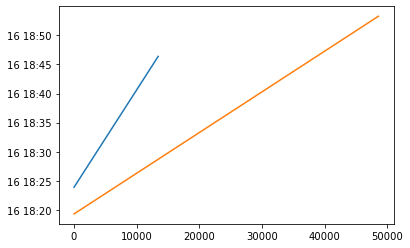

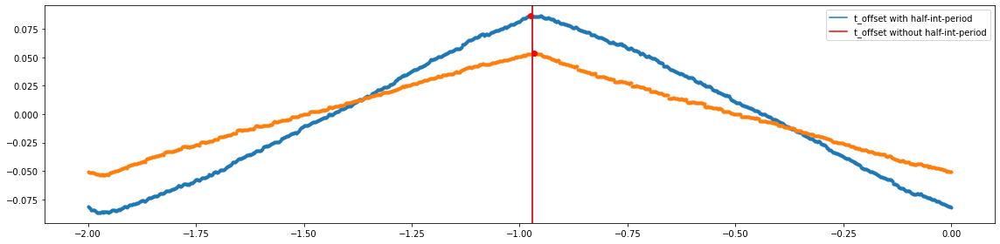

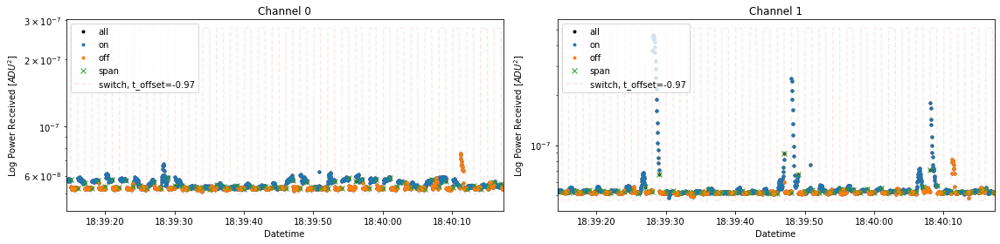

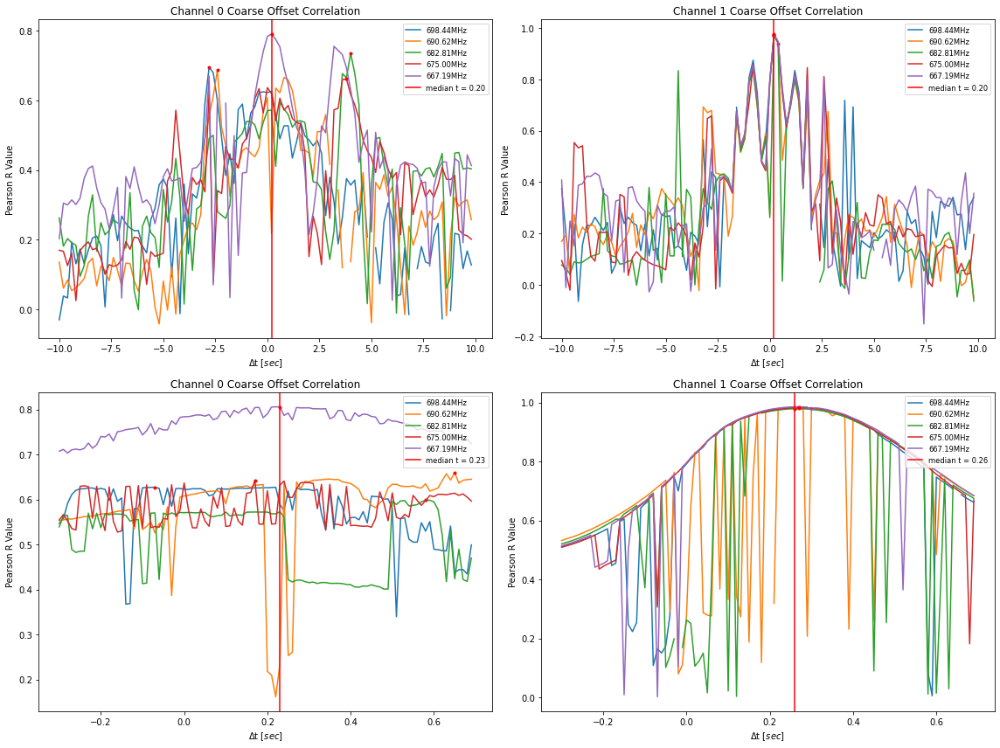

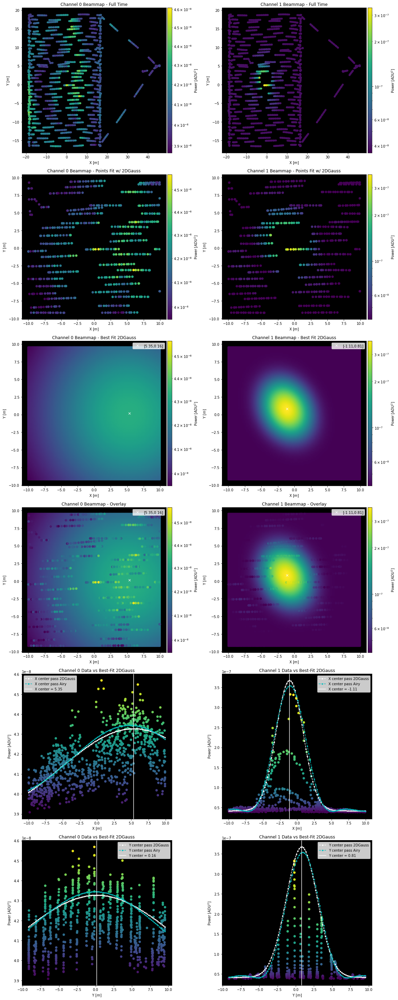

In [3]:
dronedir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916_DJI_Data/'
NFNSdrone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY708.csv',site_class=wlcsite)

## Drone flight Data: 30m drone flight in nearfield:
gaindir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T181900Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T181900Z_Suit/corr/20220916T181918Z/'

NFNScorr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite,use_ctime=True,crossmap=[1])

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(NFNSdrone.t_arr_datetime)
plot(NFNScorr.t_arr_datetime)

NFNSconcat=concat.CONCAT(CORRDATCLASS=NFNScorr,DRONEDATCLASS=NFNSdrone,\
                       config_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       output_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       load_yaml=False,save_traceback=False)

NFNSconcat.Extract_Source_Pulses(Period=2e6,Dutycycle=1e6,t_bounds=[28500,30000],f_ind=324)
NFNSconcat.Perform_Background_Subtraction(window_size=25)
NFNSconcat.Synchronization_Function(inputcorr=NFNScorr,inputdrone=NFNSdrone,freqs=np.arange(260,355,20),\
                                    FMB_coordbounds=[10.0,10.0,20.0],FMB_ampbound=0.999)


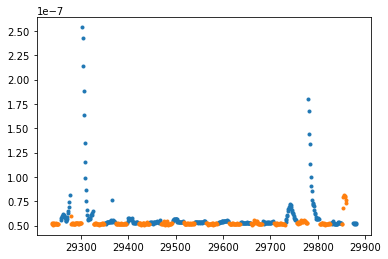

In [4]:
plot(NFNSconcat.t_index[NFNSconcat.inds_on[14000:14300]],NFNSconcat.V[NFNSconcat.inds_on[14000:14300],324,1],'.')
plot(NFNSconcat.t_index[NFNSconcat.inds_off[14000:14300]],NFNSconcat.V[NFNSconcat.inds_off[14000:14300],324,1],'.')

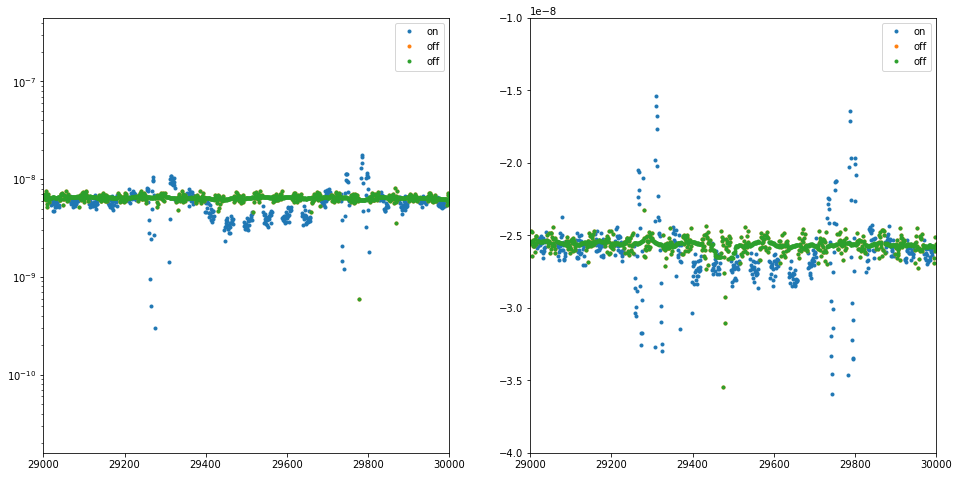

In [5]:
## Testing Background Subtraction:
fig1,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(16,8))
ax1.semilogy(NFNSconcat.t_index[NFNSconcat.inds_on],np.real(NFNSconcat.V_cross[NFNSconcat.inds_on,320]),'.',label='on')
ax1.plot(NFNSconcat.t_index[NFNSconcat.inds_off],np.real(NFNSconcat.V_cross[NFNSconcat.inds_off,320]),'.',label='off')
ax1.plot(NFNSconcat.t_index[:],np.real(NFNSconcat.V_cross_bg[:,320]),'.',label='off')
#ax1.set_ylim(1e-12,1e-7)
ax2.plot(NFNSconcat.t_index[NFNSconcat.inds_on],np.imag(NFNSconcat.V_cross[NFNSconcat.inds_on,320]),'.',label='on')
ax2.plot(NFNSconcat.t_index[NFNSconcat.inds_off],np.imag(NFNSconcat.V_cross[NFNSconcat.inds_off,320]),'.',label='off')
ax2.plot(NFNSconcat.t_index[:],np.imag(NFNSconcat.V_cross_bg[:,320]),'.',label='off')
ax2.set_ylim(-4e-8,-1e-8)
for ax in [ax1,ax2]:
    ax.set_xlim(29000,30000)
    ax.legend()

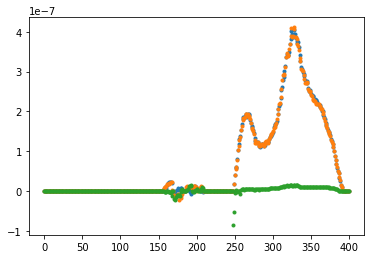

In [6]:
plot(NFNSconcat.V_bgsub[28828,:400,1],'.')
plot(NFNSconcat.V_bgsub[28829,:400,1],'.')
plot(NFNSconcat.V_bgsub[28849,:400,1],'.')

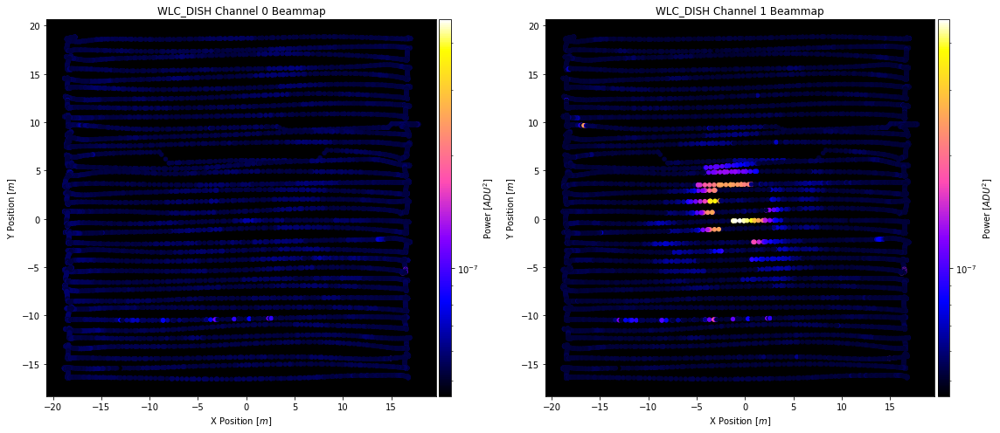

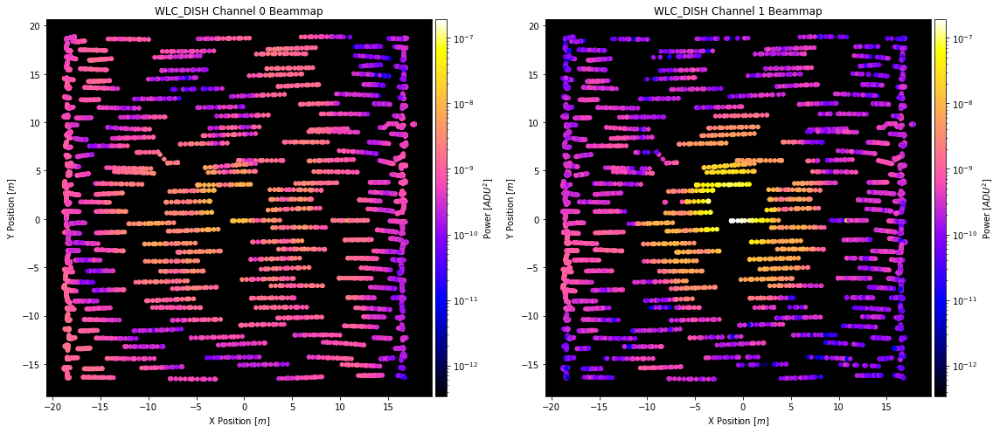

In [7]:
pu.Plot_Beammap(NFNSconcat,pulse_args=None,t_bounds=[19500,36650],dotsize=20,f_bounds=[3t24,325])
pu.Plot_Beammap(NFNSconcat,pulse_args='bgsub',t_bounds=[19500,36650],dotsize=20,f_bounds=[260,270])

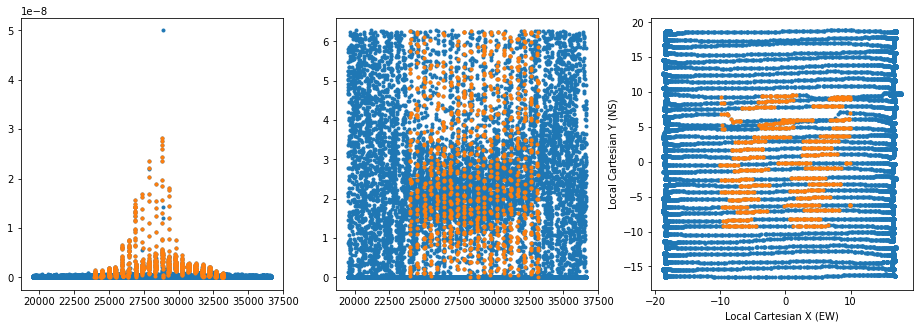

In [8]:
dx=NFNSconcat.drone_xyz_LC_interp[:,0]
dy=NFNSconcat.drone_xyz_LC_interp[:,1]
dcoords=NFNSconcat.drone_xyz_LC_interp[:,:]
find=260
wl=(3.0e8/(NFNScorr.freq[find]/1e-6))
dc=(NFNSconcat.V_cross_bgsub[:,find])
dcabs=np.abs(NFNSconcat.V_cross_bgsub[:,find])
dcang=np.angle(NFNSconcat.V_cross_bgsub[:,find])[:,0]
dcang[dcang<0]+=2*np.pi
#dcang=np.angle(NFNSconcat.V_cross_bgsub[:,find])[:,0]

tx=np.intersect1d(NFNSconcat.t_index[-10<dx],NFNSconcat.t_index[10>dx])
ty=np.intersect1d(NFNSconcat.t_index[-10<dy],NFNSconcat.t_index[10>dy])
#tx=np.intersect1d(NFNSconcat.t_index[-20<dx],NFNSconcat.t_index[17>dx])
#ty=np.intersect1d(NFNSconcat.t_index[-20<dy],NFNSconcat.t_index[20>dy])
#tphi=NFNSconcat.t_index[dcang>0]
#tcut=np.intersect1d(np.intersect1d(np.intersect1d(tx,ty),tphi),NFNSconcat.inds_on)
tcut=np.intersect1d(np.intersect1d(tx,ty),NFNSconcat.inds_on)

fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,5))
ax1.plot(NFNSconcat.t_index[19500:36650],dcabs[19500:36650],'.')
ax1.plot(NFNSconcat.t_index[tcut],dcabs[tcut],'.')
ax2.plot(NFNSconcat.t_index[19500:36650],dcang[19500:36650],'.')
ax2.plot(NFNSconcat.t_index[tcut],dcang[tcut],'.')
ax3.plot(dx[19500:36650],dy[19500:36650],'.')
ax3.plot(dx[tcut],dy[tcut],'.')
ax3.set_xlabel('Local Cartesian X (EW)')
ax3.set_ylabel('Local Cartesian Y (NS)')

dxax=np.linspace(-10,10,1000)
dyax=np.linspace(-10,10,1000)
griddx,griddy=np.meshgrid(dxax,dyax)
sqware=np.outer(dxax,dyax)

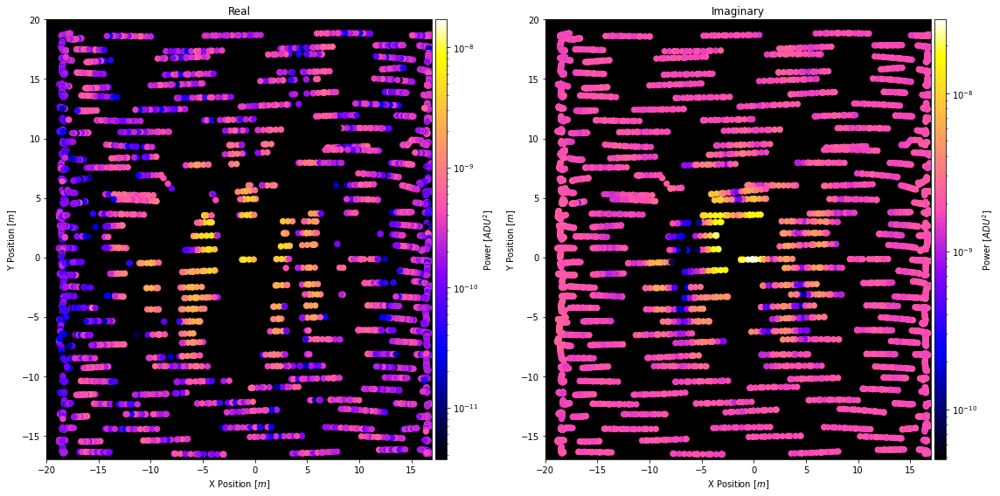

In [9]:
fig1,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(16,8))
im1=ax1.scatter(dx[NFNSconcat.inds_on],dy[NFNSconcat.inds_on],s=40,c=np.real(NFNSconcat.V_cross[NFNSconcat.inds_on,find]),cmap='gnuplot2',norm=LogNorm())
im2=ax2.scatter(dx[NFNSconcat.inds_on],dy[NFNSconcat.inds_on],s=40,c=np.imag(NFNSconcat.V_cross[NFNSconcat.inds_on,find]),cmap='gnuplot2',norm=LogNorm())
titles=['Real','Imaginary']
cbars=['Power [$ADU^2$]','Power [$ADU^2$]']
images=[im1,im2]
for i,ax in enumerate([ax1,ax2]):
    ax.set_xlim(-20,17)
    ax.set_ylim(-17,20)
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
    ax.set_title(titles[i])
tight_layout()

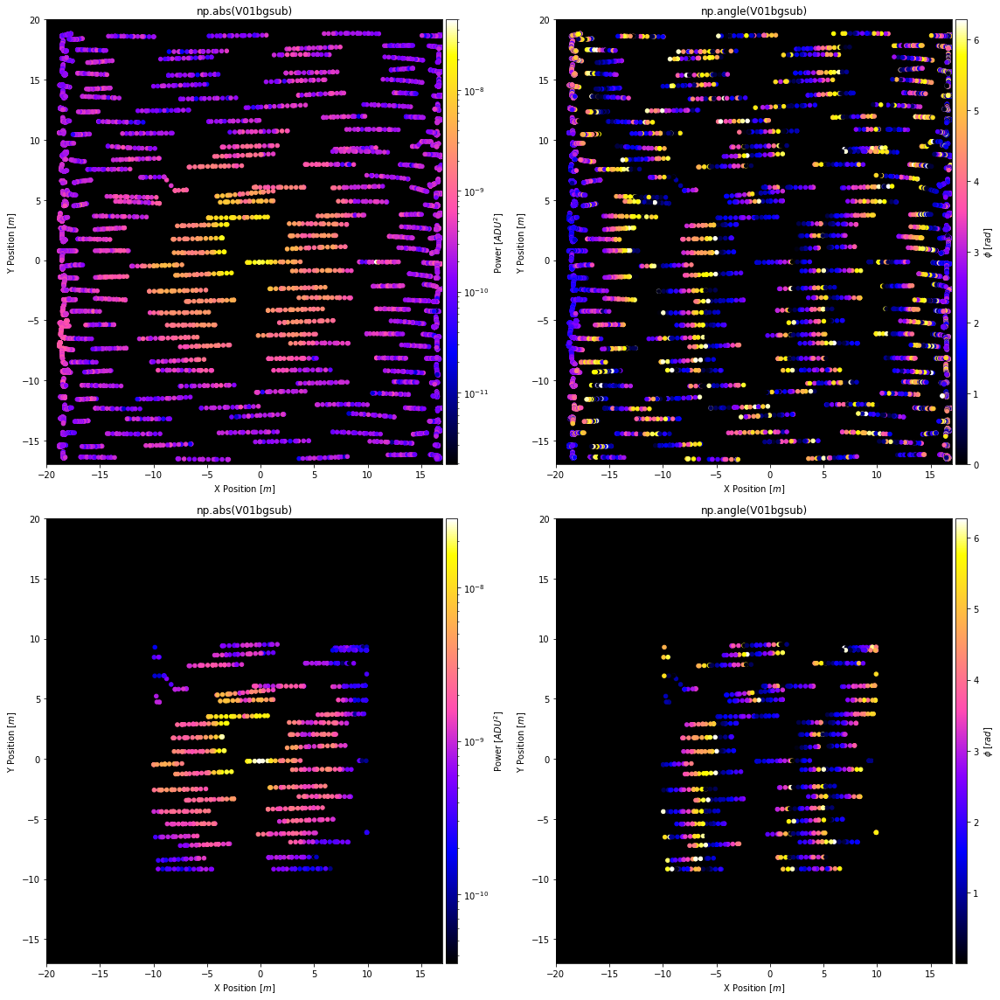

In [10]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,16))
tlb,tub=[19500,36650]
im1=ax1.scatter(dx[NFNSconcat.inds_on],dy[NFNSconcat.inds_on],s=20,c=dcabs[NFNSconcat.inds_on],cmap='gnuplot2',norm=LogNorm())
im2=ax2.scatter(dx[NFNSconcat.inds_on],dy[NFNSconcat.inds_on],s=20,c=dcang[NFNSconcat.inds_on],cmap='gnuplot2')
im3=ax3.scatter(dx[tcut],dy[tcut],s=20,c=dcabs[tcut],cmap='gnuplot2',norm=LogNorm())
im4=ax4.scatter(dx[tcut],dy[tcut],s=20,c=dcang[tcut],cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["np.abs(V01bgsub)","np.angle(V01bgsub)","np.abs(V01bgsub)","np.angle(V01bgsub)"]
cbars=['Power [$ADU^2$]','$\phi$ [$rad$]','Power [$ADU^2$]','$\phi$ [$rad$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_xlim(-20,17)
    ax.set_ylim(-17,20)
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
    ax.set_title(titles[i])
tight_layout()

In [11]:
from scipy.optimize import least_squares
from scipy.optimize import curve_fit
# Solve for ABC st (drnpos•[A,B,C])==np.angle(V01) for drnpos in cut boundaries where geometric 
# phase contribution is nonnegligible

def Fringe_Fit(P,dronepos,V):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F]),[A,B,C]))%(2*np.pi)
    return phase-V

def Fringe(P,dronepos):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F]),[A,B,C]))%(2*np.pi)
    return phase

(A,B,C)=(1.400,0.000,0.247)
(D,E,F)=(-0.000,-0.000,0.500)
G=0.200


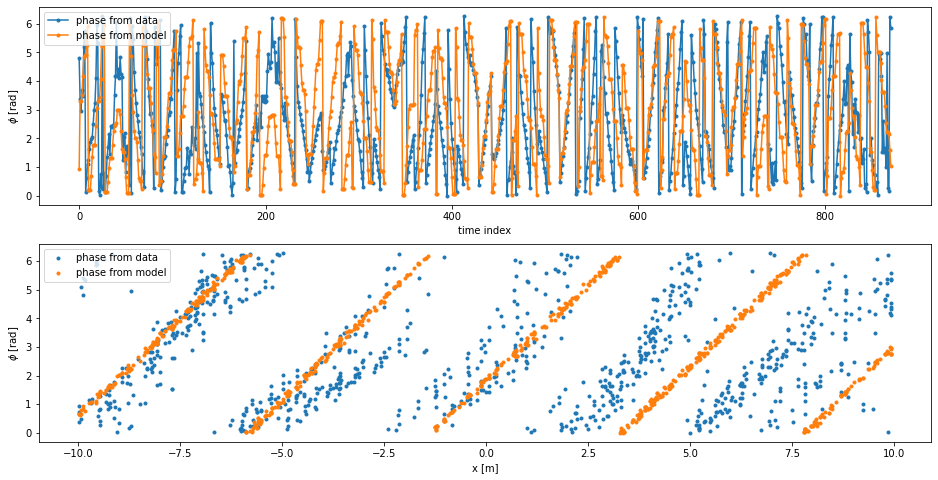

In [12]:
popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,0.0,0.0,0.5,0.2]),args=[dcoords[tcut,:],dcang[tcut]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(popt[0],popt[1],popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang[tcut],'.-',label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords[tcut]),'.-',label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[tcut][:,0],dcang[tcut],'.',label='phase from data')
ax2.plot(dcoords[tcut][:,0],Fringe(np.array(popt),dcoords[tcut]),'.',label='phase from model')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()

/var/folders/8v/bv1kqjh91h3gtkjx3rzhq6c00000gn/T/ipykernel_47720/3490470640.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)


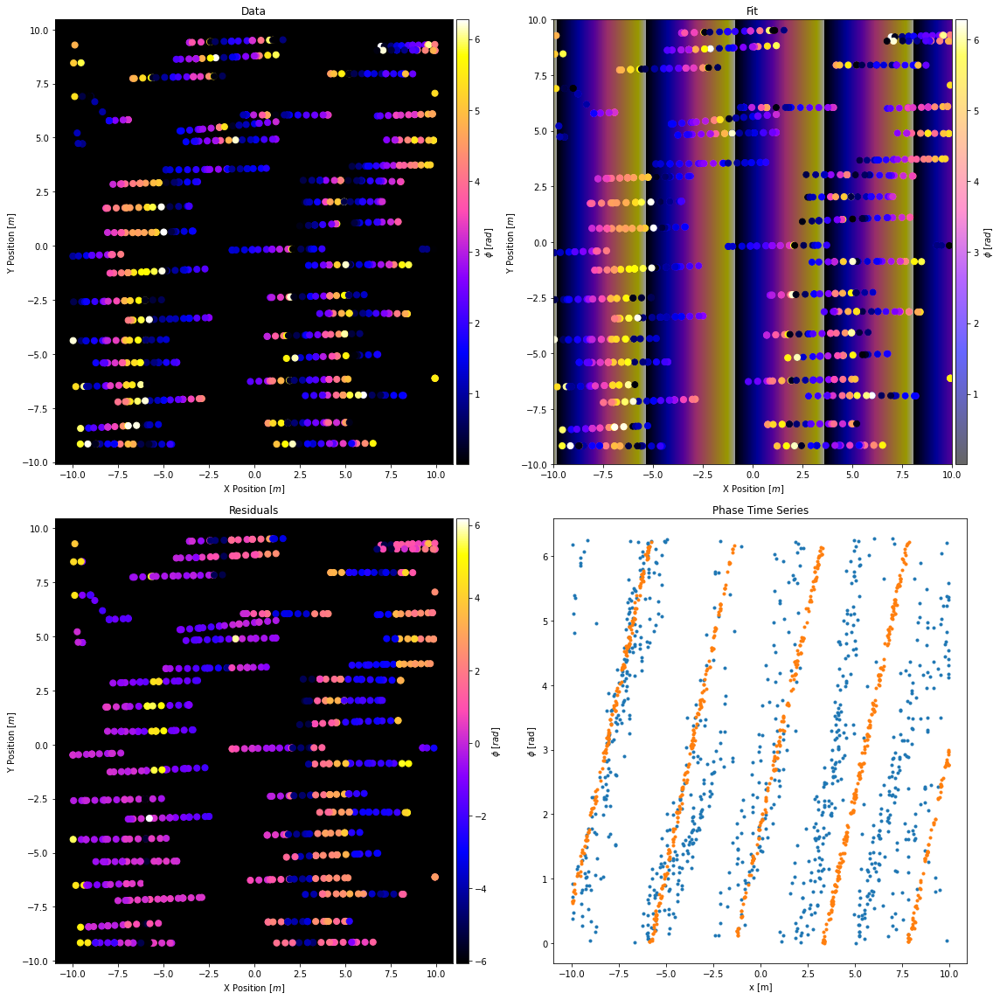

In [13]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,16))
im1=ax1.scatter(dx[tcut],dy[tcut],s=50,c=dcang[tcut],cmap='gnuplot2')
im2=ax2.scatter(dx[tcut],dy[tcut],s=50,c=Fringe(popt,dcoords[tcut]),cmap='gnuplot2')
im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
im1=ax2.scatter(dx[tcut],dy[tcut],s=50,c=dcang[tcut],cmap='gnuplot2')
im3=ax3.scatter(dx[tcut],dy[tcut],s=50,c=(dcang[tcut]-Fringe(popt,dcoords[tcut])),cmap='gnuplot2')
ax4.plot(dcoords[tcut,0],dcang[tcut],'.')
ax4.plot(dcoords[tcut,0],Fringe(np.array(popt),dcoords[tcut]),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [74]:
## Saving output data as .npz:
#stop
np.savez("/Users/wct9/Desktop/NF_Map_220916_NSPol.npz",\
         t=NFNSconcat.t_arr_datetime,\
         x=NFNSconcat.drone_xyz_LC_interp[:,0],\
         y=NFNSconcat.drone_xyz_LC_interp[:,1],\
         z=NFNSconcat.drone_xyz_LC_interp[:,2],\
         V=NFNSconcat.V[:,:400,:],\
         V_bgsub=NFNSconcat.V_bgsub[:,:400,:],
         V_bg=NFNSconcat.V_bg[:,:400,:],\
         V_cross=NFNSconcat.V_cross[:,:400,:],\
         V_cross_bgsub=NFNSconcat.V_cross_bgsub[:,:400,:],
         V_cross_bg=NFNSconcat.V_cross_bg[:,:400,:],\
         i_on=NFNSconcat.inds_on,\
         f=NFNSconcat.freq)
    

In [80]:
## Loading npz data:
dat=np.load("/Users/wct9/Desktop/NF_Map_220916_NSPol.npz")
for i in list(dat.keys()):
    print(i)

print(NFNSconcat.V_cross.shape,dat['V_cross'].shape)

t
x
y
z
V
V_bgsub
V_bg
V_cross
V_cross_bgsub
V_cross_bg
i_on
f
(48576, 1024, 1) (48576, 400, 1)


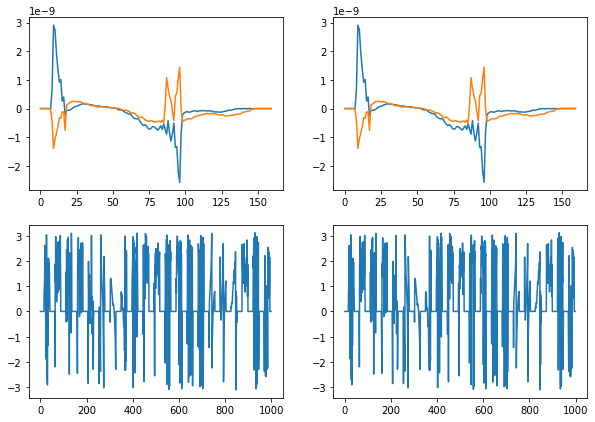

In [79]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(10,7))
ax1.plot(np.real(np.nanmean(NFNSconcat.V_cross_bgsub[29000:30000,240:400,0],axis=0)))
ax1.plot(np.imag(np.nanmean(NFNSconcat.V_cross_bgsub[29000:30000,240:400,0],axis=0)))
ax2.plot(np.real(np.nanmean(dat['V_cross_bgsub'][29000:30000,240:400,0],axis=0)))
ax2.plot(np.imag(np.nanmean(dat['V_cross_bgsub'][29000:30000,240:400,0],axis=0)))
ax3.plot(np.angle(NFNSconcat.V_cross_bgsub[29000:30000,270,0]))
ax4.plot(np.angle(dat['V_cross_bgsub'][29000:30000,270,0]))

Initializing drone data via datcon_csv routine: FLY713.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 12514/12514 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing Correlator Class using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T200937Z_Suit/corr/20220916T200956Z/
  --> Arrays initialized with shape (688, 64, 1024, 2)
Assigning array values by reading in data files:
  --> Loading File: 0687/0687
  --> Finished. Reshaping arrays.
Initializing CONCAT CLASS with active traceback using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T200937Z_Suit/corr/20220916T200956Z/
  --> FLY713.csv
  --> Traceback outputs will not be saved...
Concat initialized without previous config file...
Interpolating drone coordinates for each

/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4053: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())
/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of -0.04 seconds using Channel 1 fits.
  --> Variable synchronation successful, generating output plots:


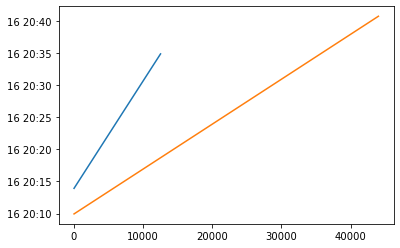

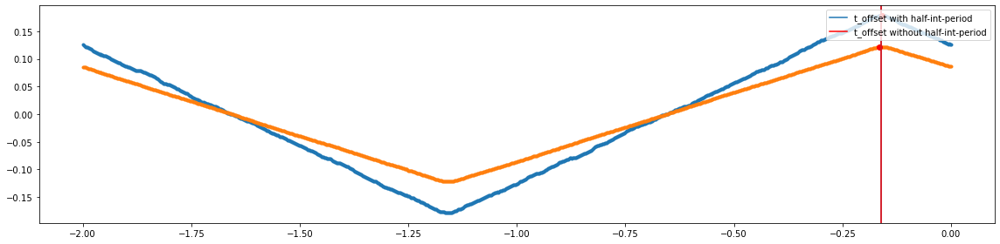

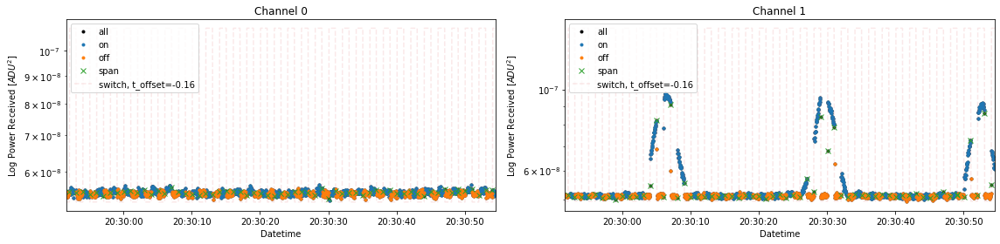

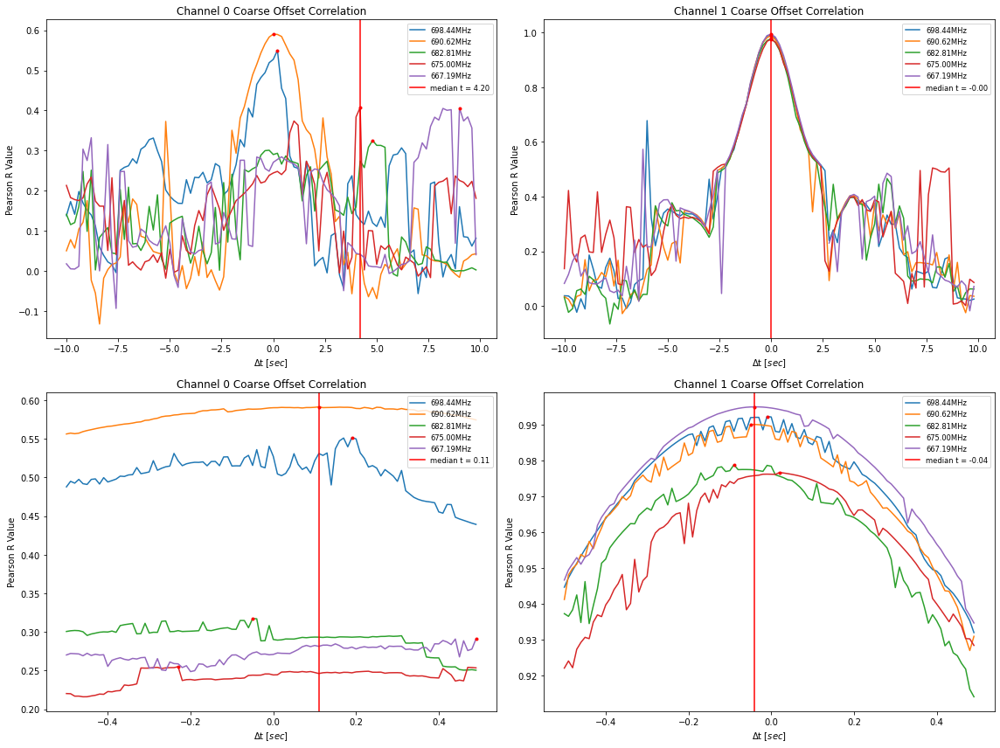

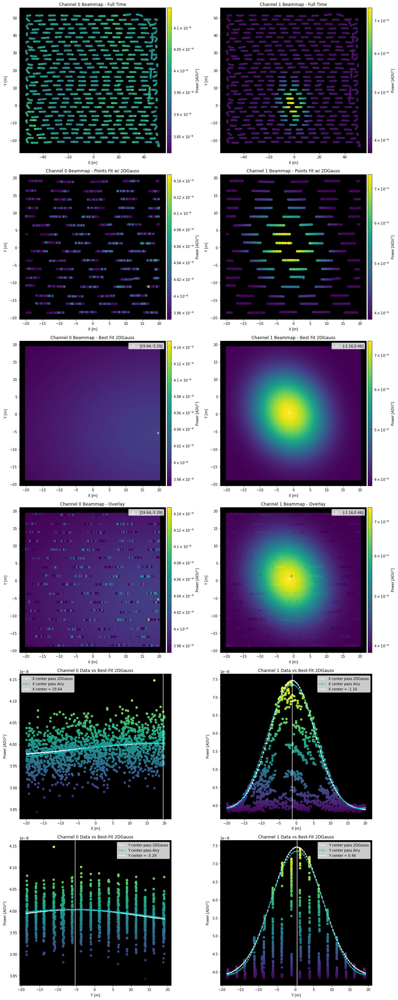

In [92]:
dronedir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916_DJI_Data/'
FFNSdrone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY713.csv',site_class=wlcsite)

gaindir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T200937Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T200937Z_Suit/corr/20220916T200956Z/'

FFNScorr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite,use_ctime=True,crossmap=[1])

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(FFNSdrone.t_arr_datetime)
plot(FFNScorr.t_arr_datetime)

FFNSconcat=concat.CONCAT(CORRDATCLASS=FFNScorr,DRONEDATCLASS=FFNSdrone,\
                       config_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       output_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       load_yaml=False,save_traceback=False)

FFNSconcat.Extract_Source_Pulses(Period=2e6,Dutycycle=1e6,t_bounds=[28500,30000],f_ind=325)
FFNSconcat.Perform_Background_Subtraction(window_size=25)
FFNSconcat.Synchronization_Function(inputcorr=FFNScorr,inputdrone=FFNSdrone,freqs=np.arange(260,355,20),\
                                    FMB_coordbounds=[20.0,20.0,90.0],FMB_ampbound=0.999)

Initializing drone data via datcon_csv routine: FLY714.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 10130/10130 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing Correlator Class using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T205310Z_Suit/corr/20220916T205329Z/
  --> Arrays initialized with shape (662, 64, 1024, 2)
Assigning array values by reading in data files:
  --> Loading File: 0661/0661
  --> Finished. Reshaping arrays.
Initializing CONCAT CLASS with active traceback using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T205310Z_Suit/corr/20220916T205329Z/
  --> FLY714.csv
  --> Traceback outputs will not be saved...
Concat initialized without previous config file...
Interpolating drone coordinates for each

/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4053: PearsonRNearConstantInputWarning: An input array is nearly constant; the computed correlation coefficient may be inaccurate.
  warnings.warn(PearsonRNearConstantInputWarning())


Applying a time correction of 0.03 seconds using Channel 1 fits.
  --> Variable synchronation successful, generating output plots:


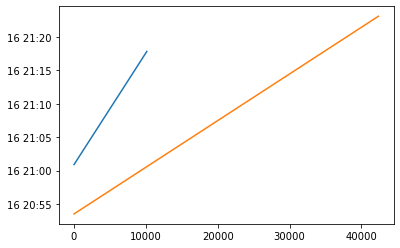

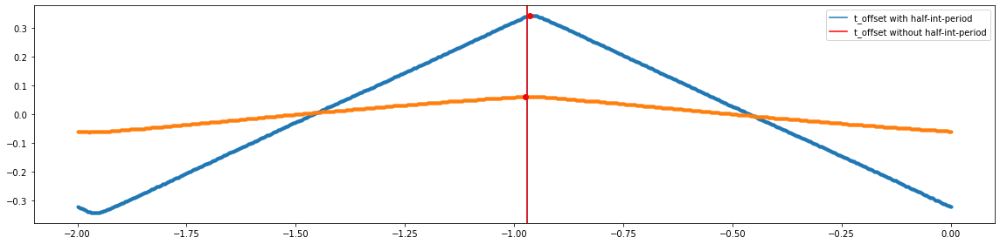

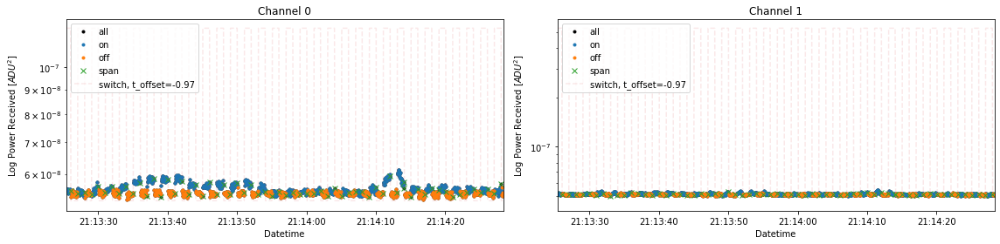

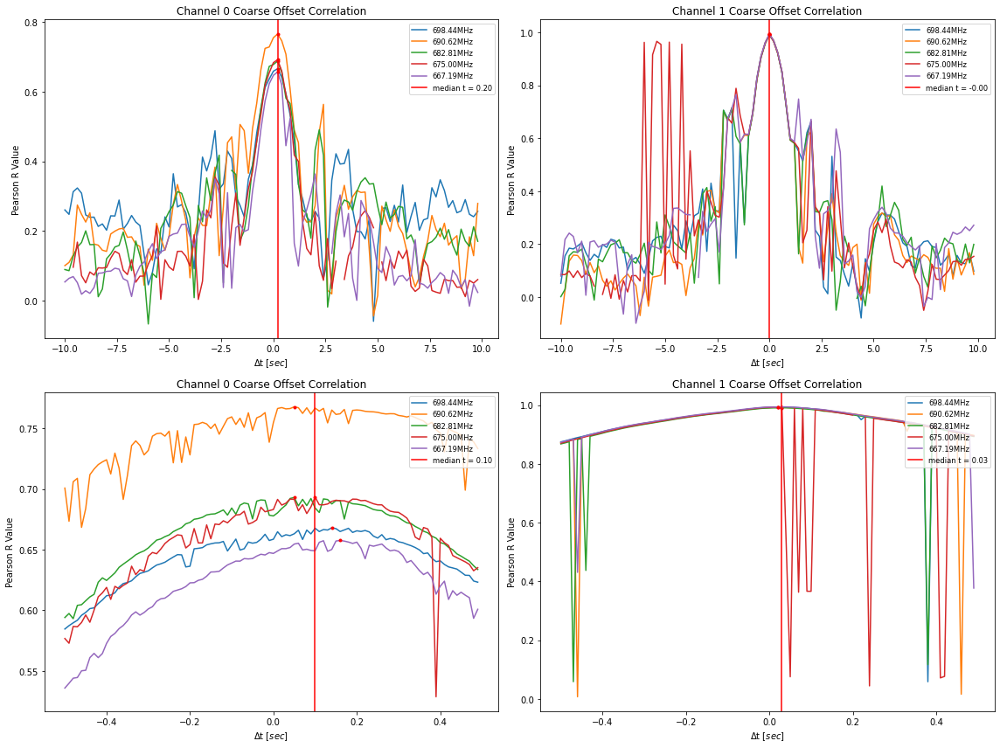

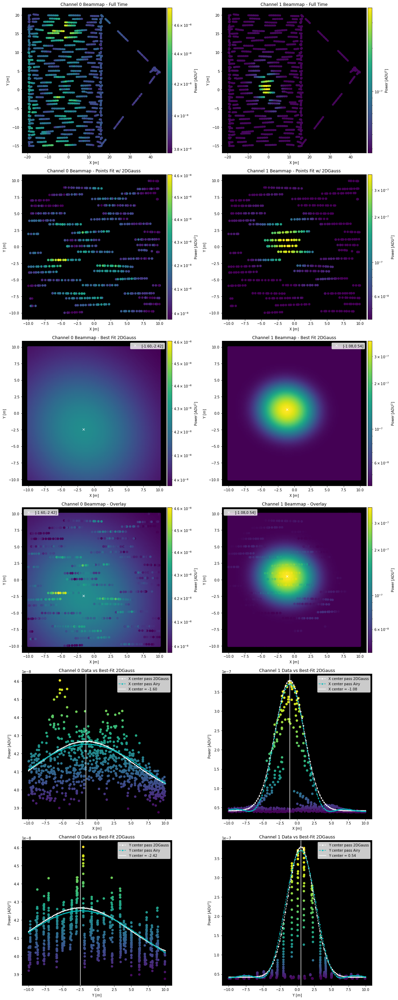

In [81]:
dronedir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916_DJI_Data/'
NFEWdrone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY714.csv',site_class=wlcsite)

gaindir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T205310Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T205310Z_Suit/corr/20220916T205329Z/'

NFEWcorr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite,use_ctime=True,crossmap=[1])

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(NFEWdrone.t_arr_datetime)
plot(NFEWcorr.t_arr_datetime)

NFEWconcat=concat.CONCAT(CORRDATCLASS=NFEWcorr,DRONEDATCLASS=NFEWdrone,\
                       config_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       output_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       load_yaml=False,save_traceback=False)

NFEWconcat.Extract_Source_Pulses(Period=2e6,Dutycycle=1e6,t_bounds=[28500,30000],f_ind=325)
NFEWconcat.Perform_Background_Subtraction(window_size=25)
NFEWconcat.Synchronization_Function(inputcorr=NFEWcorr,inputdrone=NFEWdrone,freqs=np.arange(260,355,20),\
                                    FMB_coordbounds=[10.0,10.0,20.0],FMB_ampbound=0.999)

/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


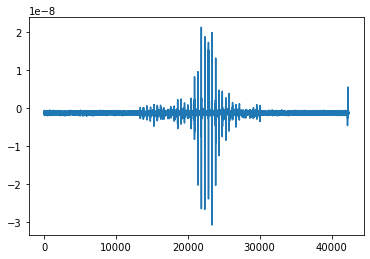

In [82]:
plot(NFEWconcat.t_index,NFEWconcat.V_cross[:,340])


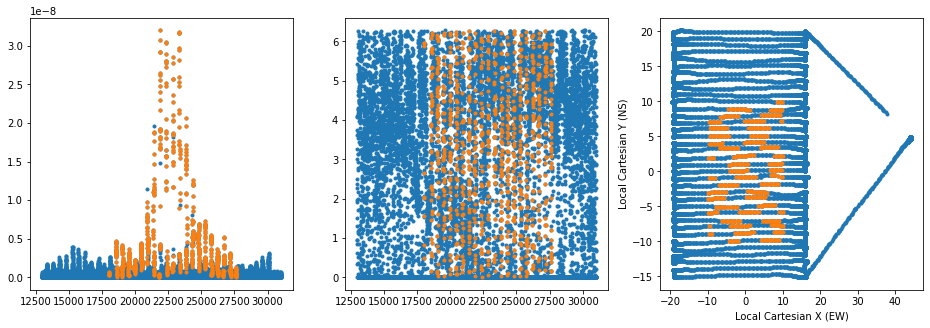

In [83]:
dx=NFEWconcat.drone_xyz_LC_interp[:,0]
dy=NFEWconcat.drone_xyz_LC_interp[:,1]
dcoords=NFEWconcat.drone_xyz_LC_interp[:,:]
find=340
wl=(3.0e8/(NFEWcorr.freq[find]/1e-6))
dc=(NFEWconcat.V_cross_bgsub[:,find])
dcabs=np.abs(NFEWconcat.V_cross_bgsub[:,find])
dcang=np.angle(NFEWconcat.V_cross_bgsub[:,find])[:,0]
dcang[dcang<0]+=2*np.pi
#dcang=np.angle(NFNSconcat.V_cross_bgsub[:,find])[:,0]

tx=np.intersect1d(NFEWconcat.t_index[-10<dx],NFEWconcat.t_index[10>dx])
ty=np.intersect1d(NFEWconcat.t_index[-10<dy],NFEWconcat.t_index[10>dy])
#tx=np.intersect1d(NFEWconcat.t_index[-20<dx],NFEWconcat.t_index[17>dx])
#ty=np.intersect1d(NFEWconcat.t_index[-20<dy],NFEWconcat.t_index[20>dy])
#tphi=NFEWconcat.t_index[dcang>0]
#tcut=np.intersect1d(np.intersect1d(np.intersect1d(tx,ty),tphi),NFEWconcat.inds_on)
tcut=np.intersect1d(np.intersect1d(tx,ty),NFEWconcat.inds_on)

fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,5))
ax1.plot(NFEWconcat.t_index[13000:31000],dcabs[13000:31000],'.')
ax1.plot(NFEWconcat.t_index[tcut],dcabs[tcut],'.')
ax2.plot(NFEWconcat.t_index[13000:31000],dcang[13000:31000],'.')
ax2.plot(NFEWconcat.t_index[tcut],dcang[tcut],'.')
ax3.plot(dx[13000:31000],dy[13000:31000],'.')
ax3.plot(dx[tcut],dy[tcut],'.')
ax3.set_xlabel('Local Cartesian X (EW)')
ax3.set_ylabel('Local Cartesian Y (NS)')

dxax=np.linspace(-50,50,1000)
dyax=np.linspace(-50,50,1000)
griddx,griddy=np.meshgrid(dxax,dyax)
sqware=np.outer(dxax,dyax)

In [84]:
NFEWconcat.t_delta_dji

0.029999999999964944

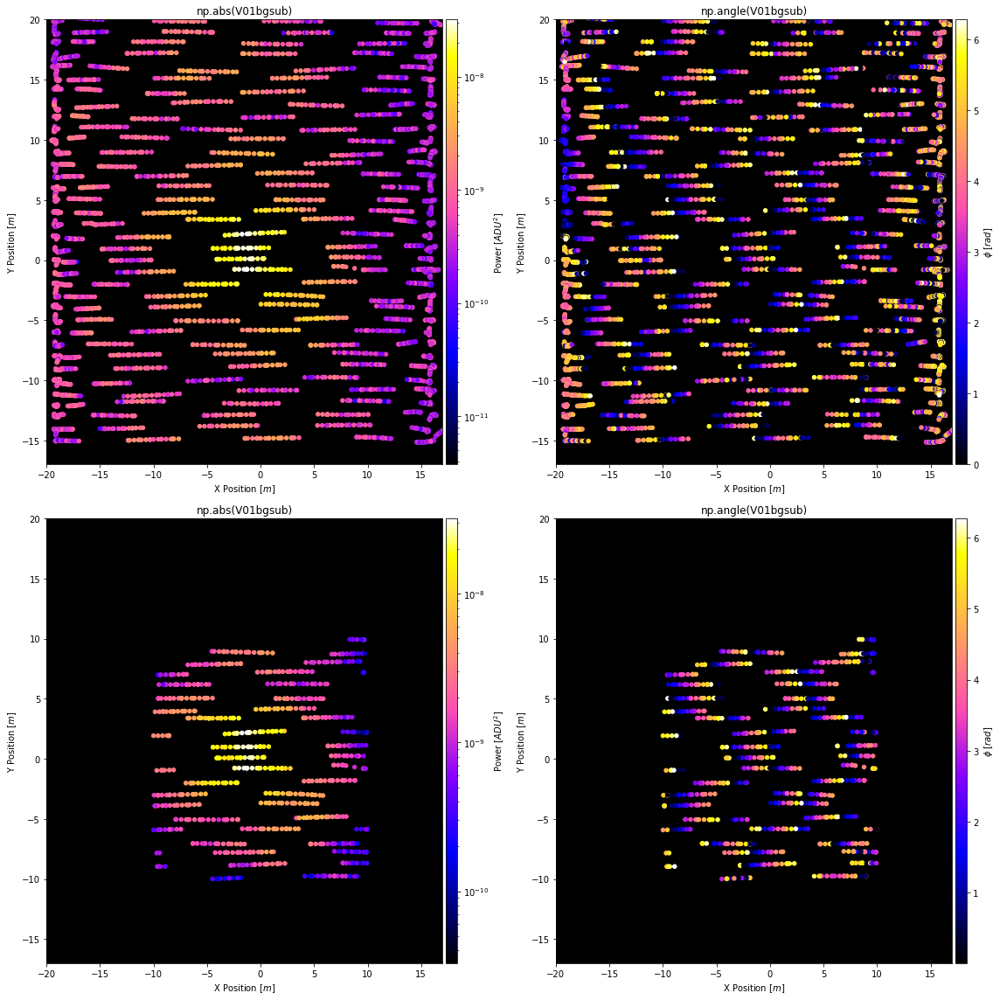

In [85]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,16))
tlb,tub=[19500,36650]
im1=ax1.scatter(dx[NFEWconcat.inds_on],dy[NFEWconcat.inds_on],s=20,c=dcabs[NFEWconcat.inds_on],cmap='gnuplot2',norm=LogNorm())
im2=ax2.scatter(dx[NFEWconcat.inds_on],dy[NFEWconcat.inds_on],s=20,c=dcang[NFEWconcat.inds_on],cmap='gnuplot2')
im3=ax3.scatter(dx[tcut],dy[tcut],s=20,c=dcabs[tcut],cmap='gnuplot2',norm=LogNorm())
im4=ax4.scatter(dx[tcut],dy[tcut],s=20,c=dcang[tcut],cmap='gnuplot2')
images=[im1,im2,im3,im4]
titles=["np.abs(V01bgsub)","np.angle(V01bgsub)","np.abs(V01bgsub)","np.angle(V01bgsub)"]
cbars=['Power [$ADU^2$]','$\phi$ [$rad$]','Power [$ADU^2$]','$\phi$ [$rad$]']
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_xlim(-20,17)
    ax.set_ylim(-17,20)
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
    ax.set_title(titles[i])
tight_layout()

In [86]:
from scipy.optimize import least_squares
from scipy.optimize import curve_fit
# Solve for ABC st (drnpos•[A,B,C])==np.angle(V01) for drnpos in cut boundaries where geometric 
# phase contribution is nonnegligible

def Fringe_Fit(P,dronepos,V):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F]),[A,B,C]))%(2*np.pi)
    return phase-V

def Fringe(P,dronepos):
    A,B,C,D,E,F,G=P
    phase=(np.dot(dronepos+np.array([D,E,F]),[A,B,C]))%(2*np.pi)
    return phase

(A,B,C)=(1.461,-0.013,0.133)
(D,E,F)=(2.986,0.011,1.240)
G=0.200


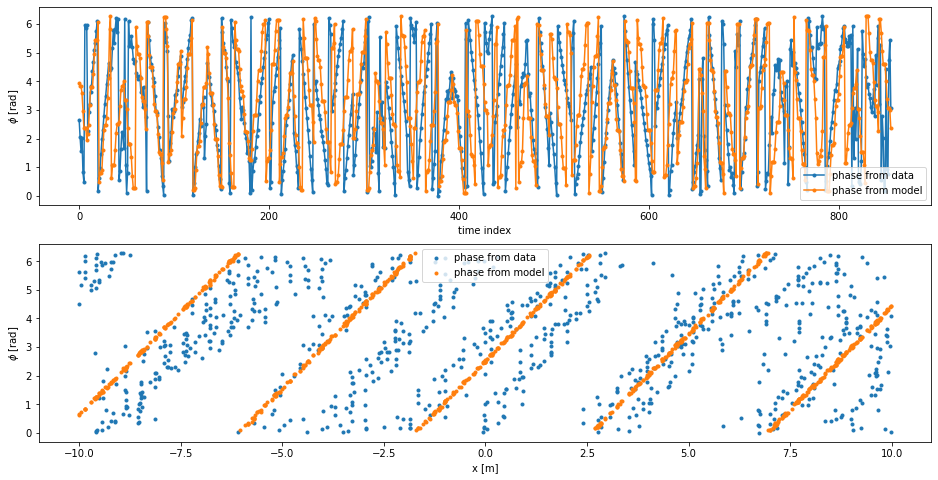

In [87]:
popt=least_squares(Fringe_Fit,x0=np.array([1.4,0.0,0.25,0.0,0.0,0.5,0.2]),args=[dcoords[tcut,:],dcang[tcut]]).x
print("(A,B,C)=({:.3f},{:.3f},{:.3f})".format(popt[0],popt[1],popt[2]))
print("(D,E,F)=({:.3f},{:.3f},{:.3f})".format(popt[3],popt[4],popt[5]))
print("G={:.3f}".format(popt[6]))
#print(Fringe(popt,dcoords[tcut]))

fig1,[ax1,ax2]=subplots(nrows=2,ncols=1,figsize=(16,8))
ax1.plot(dcang[tcut],'.-',label='phase from data')
ax1.plot(Fringe(np.array(popt),dcoords[tcut]),'.-',label='phase from model')
ax1.set_xlabel("time index")
ax1.set_ylabel("$\phi$ [rad]")
ax1.legend()
ax2.plot(dcoords[tcut][:,0],dcang[tcut],'.',label='phase from data')
ax2.plot(dcoords[tcut][:,0],Fringe(np.array(popt),dcoords[tcut]),'.',label='phase from model')
#ax2.plot(dcoords[tcut][:,0],Fringe(np.array([1.5,0.1,0.4,0.0,0.0,0.9,0.9]),dcoords[tcut]),'.',label='phase from model')
ax2.set_xlabel("x [m]")
ax2.set_ylabel("$\phi$ [rad]")
ax2.legend()

/var/folders/8v/bv1kqjh91h3gtkjx3rzhq6c00000gn/T/ipykernel_47720/3490470640.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)


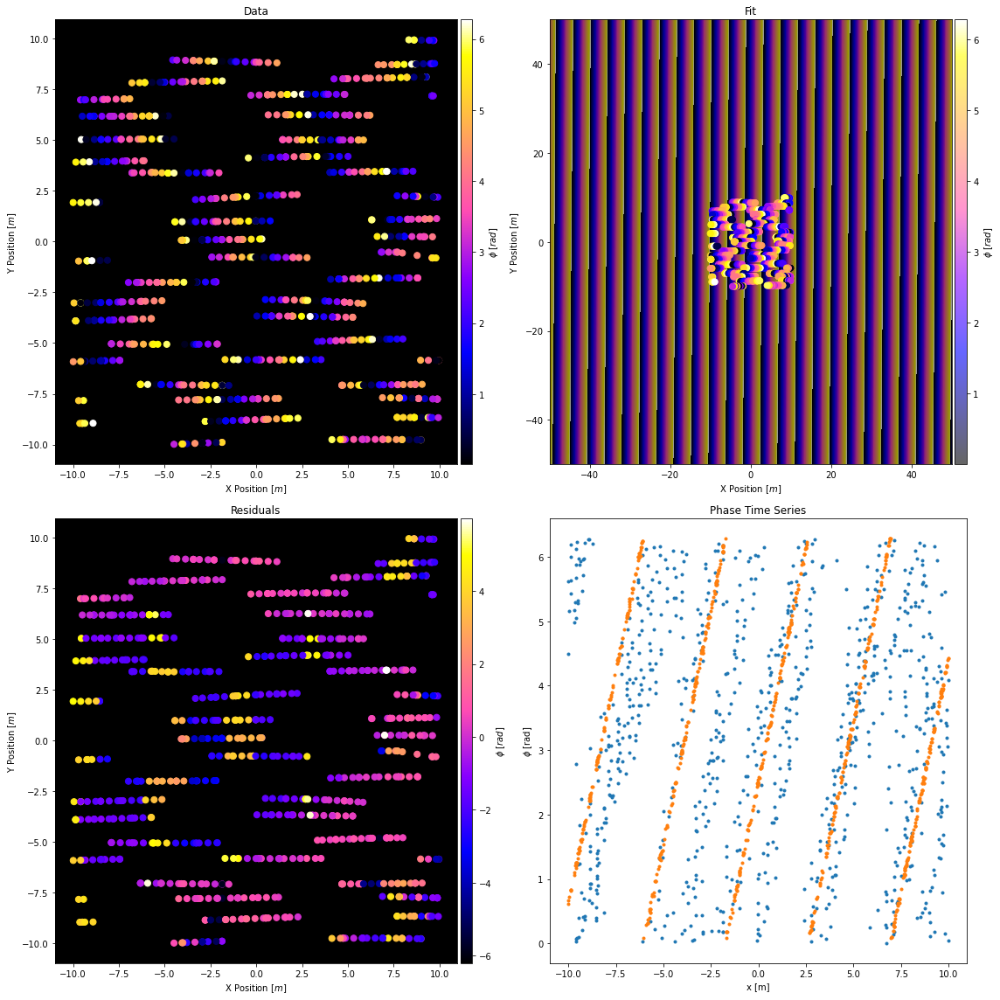

In [88]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(16,16))
im1=ax1.scatter(dx[tcut],dy[tcut],s=50,c=dcang[tcut],cmap='gnuplot2')
im2=ax2.scatter(dx[tcut],dy[tcut],s=50,c=Fringe(popt,dcoords[tcut]),cmap='gnuplot2')
im2=ax2.pcolormesh(dxax,dyax,Fringe(popt,np.array([griddx.flatten(),griddy.flatten(),30*np.ones(len(griddx.flatten()))]).T).reshape(griddx.shape),cmap='gnuplot2',alpha=0.6)
im1=ax2.scatter(dx[tcut],dy[tcut],s=50,c=dcang[tcut],cmap='gnuplot2')
im3=ax3.scatter(dx[tcut],dy[tcut],s=50,c=(dcang[tcut]-Fringe(popt,dcoords[tcut])),cmap='gnuplot2')
ax4.plot(dcoords[tcut,0],dcang[tcut],'.')
ax4.plot(dcoords[tcut,0],Fringe(np.array(popt),dcoords[tcut]),'.')
images=[im1,im2,im3]
cbars=['$\phi$ [$rad$]','$\phi$ [$rad$]','$\phi$ [$rad$]']
titles=["Data","Fit","Residuals","Phase Time Series"]
for i,ax in enumerate([ax1,ax2,ax3]):
    ax.set_facecolor("k")
    ax.set_xlabel('X Position $[m]$')
    ax.set_ylabel('Y Position $[m]$')
    divider=make_axes_locatable(ax)
    cax=divider.append_axes("right", size="3%", pad=0.05)
    cbar=fig1.colorbar(images[i],cax=cax)
    cbar.set_label(cbars[i])
for i,ax in enumerate([ax1,ax2,ax3,ax4]):
    ax.set_title(titles[i])
ax4.set_xlabel("x [m]")
ax4.set_ylabel("$\phi$ [rad]")
tight_layout()


In [89]:
## Saving output data as .npz:
#stop
np.savez("/Users/wct9/Desktop/NF_Map_220916_EWPol.npz",\
         t=NFEWconcat.t_arr_datetime,\
         x=NFEWconcat.drone_xyz_LC_interp[:,0],\
         y=NFEWconcat.drone_xyz_LC_interp[:,1],\
         z=NFEWconcat.drone_xyz_LC_interp[:,2],\
         V=NFEWconcat.V[:,:400,:],\
         V_bgsub=NFEWconcat.V_bgsub[:,:400,:],
         V_bg=NFEWconcat.V_bg[:,:400,:],\
         V_cross=NFEWconcat.V_cross[:,:400,:],\
         V_cross_bgsub=NFEWconcat.V_cross_bgsub[:,:400,:],
         V_cross_bg=NFEWconcat.V_cross_bg[:,:400,:],\
         i_on=NFEWconcat.inds_on,\
         f=NFEWconcat.freq)
    

In [90]:
## Loading npz data:
dat=np.load("/Users/wct9/Desktop/NF_Map_220916_EWPol.npz")
for i in list(dat.keys()):
    print(i)

print(NFEWconcat.V_cross.shape,dat['V_cross'].shape)

t
x
y
z
V
V_bgsub
V_bg
V_cross
V_cross_bgsub
V_cross_bg
i_on
f
(42368, 1024, 1) (42368, 400, 1)


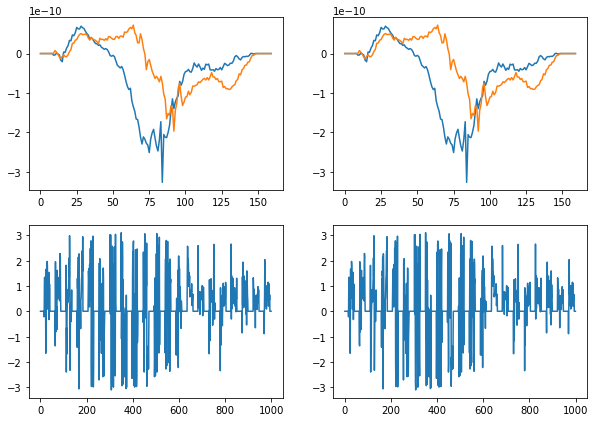

In [91]:
fig1,[[ax1,ax2],[ax3,ax4]]=subplots(nrows=2,ncols=2,figsize=(10,7))
ax1.plot(np.real(np.nanmean(NFEWconcat.V_cross_bgsub[29000:30000,240:400,0],axis=0)))
ax1.plot(np.imag(np.nanmean(NFEWconcat.V_cross_bgsub[29000:30000,240:400,0],axis=0)))
ax2.plot(np.real(np.nanmean(dat['V_cross_bgsub'][29000:30000,240:400,0],axis=0)))
ax2.plot(np.imag(np.nanmean(dat['V_cross_bgsub'][29000:30000,240:400,0],axis=0)))
ax3.plot(np.angle(NFEWconcat.V_cross_bgsub[29000:30000,270,0]))
ax4.plot(np.angle(dat['V_cross_bgsub'][29000:30000,270,0]))

Initializing drone data via datcon_csv routine: FLY715.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK data contains 11159/11159 non-nan values
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
Initializing Correlator Class using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T212457Z_Suit/corr/20220916T212516Z/
  --> Arrays initialized with shape (591, 64, 1024, 2)
Assigning array values by reading in data files:
  --> Loading File: 0590/0590
  --> Finished. Reshaping arrays.
Initializing CONCAT CLASS with active traceback using:
  --> /Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T212457Z_Suit/corr/20220916T212516Z/
  --> FLY715.csv
  --> Traceback outputs will not be saved...
Concat initialized without previous config file...
Interpolating drone coordinates for each

/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/beamcals/concat.py:319: RuntimeWarning: Mean of empty slice
  self.V_bg[k,:,:]=np.nanmean(self.V[t_window,:,:],axis=0)
/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/beamcals/concat.py:321: RuntimeWarning: Mean of empty slice
  self.V_cross_bg[k,:,:]=np.nanmean(self.V_cross[t_window,:,:],axis=0)


  --> Background subtraction completed using window_size = 25
Synchronizing data from correlator and drone:
  --> Previous t_delta_dji not found
  --> Calculating via 2DGauss fitting routine:


/Users/wct9/anaconda3/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Applying a time correction of 0.29 seconds using Channel 1 fits.
  --> Variable synchronation successful, generating output plots:


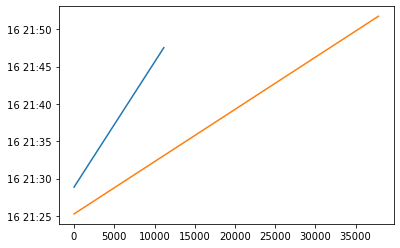

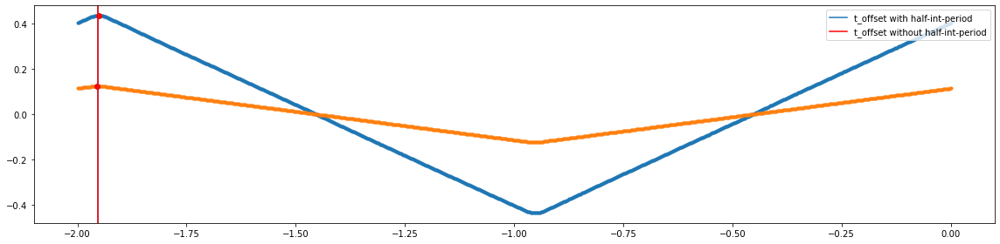

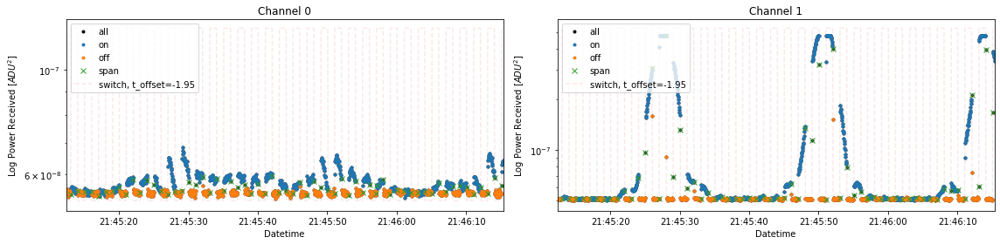

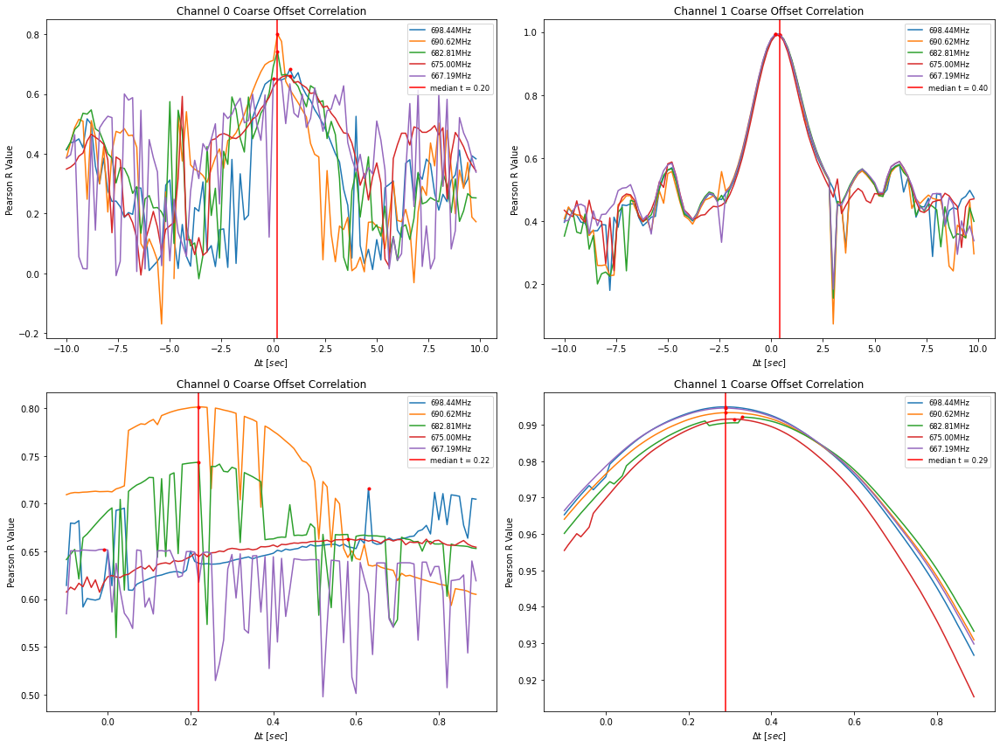

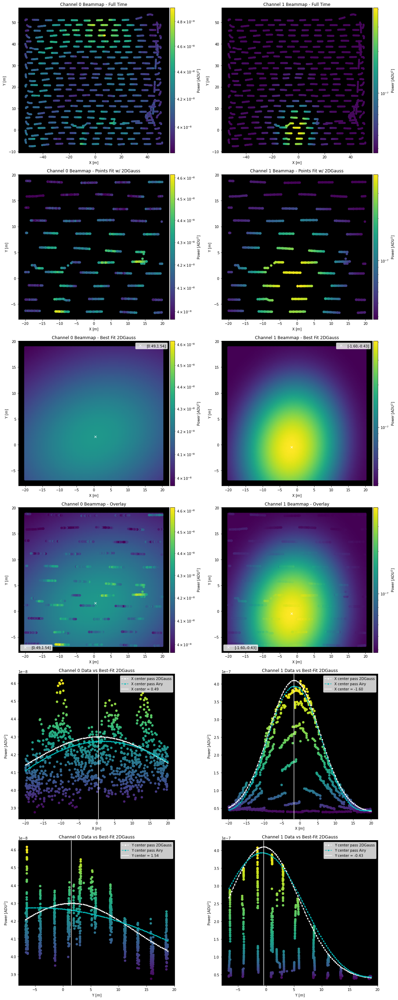

In [23]:
dronedir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916_DJI_Data/'
FFEWdrone=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY715.csv',site_class=wlcsite)

gaindir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T212457Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916_WLC_NFandFF/20220916T212457Z_Suit/corr/20220916T212516Z/'

FFEWcorr=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite,use_ctime=True,crossmap=[1])

## Since we know the data are from the same time we can combine them with the Concat_Class:
plot(FFEWdrone.t_arr_datetime)
plot(FFEWcorr.t_arr_datetime)

FFEWconcat=concat.CONCAT(CORRDATCLASS=FFEWcorr,DRONEDATCLASS=FFEWdrone,\
                       config_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       output_directory="/Users/wct9/Desktop/20220916_WLC_NFandFF/",\
                       load_yaml=False,save_traceback=False)

FFEWconcat.Extract_Source_Pulses(Period=2e6,Dutycycle=1e6,t_bounds=[28500,30000],f_ind=325)
FFEWconcat.Perform_Background_Subtraction(window_size=25)
FFEWconcat.Synchronization_Function(inputcorr=FFEWcorr,inputdrone=FFEWdrone,freqs=np.arange(260,355,20),\
                                    FMB_coordbounds=[20.0,20.0,90.0],FMB_ampbound=0.999)

In [24]:
## Reference Level test: Looks good
gaindir='/Users/wct9/Desktop/20220916T175448Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916T175448Z_Suit/corr/20220916T175507Z/'
test=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite)
pu.Plot_Waterfalls(test)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/wct9/Desktop/20220916T175448Z_Suit/corr/20220916T175507Z/'

In [ ]:
## NF Flight: 30m NSPol
gaindir='/Users/wct9/Desktop/20220916T181900Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916T181900Z_Suit/corr/20220916T181918Z/'
test=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite)

In [ ]:
pu.Plot_Waterfalls(test)
pu.Plot_Time_Series(test,tbounds=[18000,38000],freqlist=[260,305,325,340,355])

In [ ]:
## FF Flight: 100m NSPol
gaindir='/Users/wct9/Desktop/20220916T200937Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220916T200937Z_Suit/corr/20220916T200956Z/'
test=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=wlcsite)

In [ ]:
pu.Plot_Waterfalls(test)
pu.Plot_Time_Series(test,tbounds=[0,-1],freqlist=[260,305,325,340,355])

In [ ]:
stop

In [ ]:
## Read in the Drone_Data class: ## These flights are 693 to 707, let's identify them:
dronedir='/Users/wct9/Desktop/20220824_WLC_NFandFF/20220825_DJI_GPS_data/'

os.chdir(dronedir)
drnfiles=np.sort(glob.glob('*.csv'))
os.chdir('/Users/wct9/python')

print(drnfiles)
## FLY703.csv - Amplitude level flight and GPS coordinate scouting 
## FLY705.csv - NF@30mhmsl Flight
## FLY706.csv - FF@100mhmsl Flight

In [ ]:
## Import calibration test document to find coords of WLC Dish location:
dronetest=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY703.csv',site_class=wlcsite,ignore_rtk=True)
pu.Plot_Drone_Coordinates(dronetest)

In [ ]:
fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,5))

## DISH COORDS?
    #Google Earth Satellite View: Lat,Lon = 41.319458,-72.921329
    #Drone Over dish coords: 41.319436,-72.921325
    #Best estimate of hmsl? 52.93-25.0 --> 27.93m hmsl?

for x,y in [[0,-1],[2000,2700],[3800,4900],[6000,7000],[8200,9000]]:
    print(np.nanmean(dronetest.coords_llh[x:y,:],axis=0))
    ax1.plot(dronetest.t_index[x:y],dronetest.coords_llh[x:y,0],'.')
    ax2.plot(dronetest.t_index[x:y],dronetest.coords_llh[x:y,1],'.')
    ax3.plot(dronetest.t_index[x:y],dronetest.coords_llh[x:y,2],'.')


In [ ]:
## Trial data for drone flights!:
gaindir='/Users/wct9/Desktop/20220824T193718Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824T193718Z_Suit/corr/20220824T193737Z/'

#test1=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)
#test1=Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir)

## Determine appropriate gain settings: either [1.0, 25] or [1.0, 26] seem best
## initial gain level [1.0,24]:
gaindir='/Users/wct9/Desktop/20220824T213847Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824T213847Z_Suit/corr/20220824T213907Z/'
test2=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)
## initial gain level [1.0,25]:
gaindir='/Users/wct9/Desktop/20220824T214301Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824T214301Z_Suit/corr/20220824T214320Z/'
test3=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)
## initial gain level [1.0,26]:
gaindir='/Users/wct9/Desktop/20220824T214601Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824T214601Z_Suit/corr/20220824T214621Z/'
test4=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)
## initial gain level [1.0,27]: Clearly saturated
gaindir='/Users/wct9/Desktop/20220824T214846Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824T214846Z_Suit/corr/20220824T214905Z/'
test5=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)

In [ ]:
pu.Plot_Waterfalls(test2)
pu.Plot_Waterfalls(test3)
pu.Plot_Waterfalls(test4)
pu.Plot_Waterfalls(test5)

fig1,[ax1,ax2]=subplots(nrows=1,ncols=2,figsize=(16,5),sharey=True)
pkeys=[24,25,26,27]
for i,x in enumerate([test2,test3,test4,test5]):
    ax1.plot(np.nanmean(x.V[10:100,::-1,0],axis=0),label='gain coeffs = [1.0, {}]'.format(pkeys[i]))
    ax2.plot(np.nanmean(x.V[10:100,::-1,1],axis=0),label='gain coeffs = [1.0, {}]'.format(pkeys[i]))
ax1.legend()
ax2.legend()

In [ ]:
## Trial data for drone flights: 100m drone flight in farfield:
gaindir='/Users/wct9/Desktop/20220824_WLC_NFandFF/WLC_Corr_Data/20220825T205959Z_Suit_digitalgain/'
datadir='/Users/wct9/Desktop/20220824_WLC_NFandFF/WLC_Corr_Data/20220825T205959Z_Suit/corr/20220825T210017Z/'

#test1=corr.Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir,site_class=lfopsite)
test1=Corr_Data(Data_Directory=datadir,Gain_Directory=gaindir)

In [ ]:
test1.V_full.shape

In [ ]:
fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,20))
ax1.imshow(np.abs(test1.V_full[:,::-1,0]),aspect="auto",extent=[test1.freq[400],test1.freq[250],44160,0],cmap='gnuplot2',norm=LogNorm())
ax1.set_title('bicolog NS Pol')
ax2.imshow(np.abs(test1.V_full[:,::-1,2]),aspect="auto",extent=[test1.freq[400],test1.freq[250],44160,0],cmap='gnuplot2',norm=LogNorm())
ax2.set_title('Dish NS Pol')
ax3.imshow(np.abs(test1.V_full[:,::-1,1]),aspect="auto",extent=[test1.freq[400],test1.freq[250],44160,0],cmap='gnuplot2')
ax3.set_title('Cross-Correlation')


In [ ]:
plot(np.nanmean(test1.V_full[6000:10000,:,0],axis=0),'.')
plot(np.nanmean(test1.V_full[6000:10000,:,2],axis=0),'.')

In [ ]:
fig1,[ax1,ax2,ax3]=subplots(nrows=1,ncols=3,figsize=(16,8),sharey=True)

ax1.set_title('Bicolog NS Pol')
ax2.set_title('Vivaldi+Dish NS Pol')
ax3.set_title('Cross-Correlation')
for x in [260,305,325]:
    ax1.plot(test1.V_full[15000:35000,x,0],'.',label='{:.2f}MHz'.format(test1.freq[x]))
    ax2.plot(test1.V_full[15000:35000,x,2],'.',label='{:.2f}MHz'.format(test1.freq[x]))
    ax3.plot(test1.V_full[15000:35000,x,1],'.',label='{:.2f}MHz'.format(test1.freq[x]))
ax1.legend()
ax2.legend()
ax3.legend()
#260,305,325,355

In [ ]:
fig1,[ax1,ax2,ax3]=subplots(nrows=3,ncols=1,figsize=(16,12))
ax1.plot(np.imag(test1.V_full[10000:40000,315,1]),label='real')
ax1.plot(np.real(test1.V_full[10000:40000,315,1]),label='imag')
ax2.plot(np.abs(test1.V_full[10000:40000,315,1]),label='abs')
ax3.plot(np.angle(test1.V_full[10000:40000,315,1]),label='phase')
ax1.legend()
ax2.legend()
ax3.legend()